In [ ]:
import pandas as pd

df = pd.read_csv("../dataset/amazon_products_sales_data_cleaned.csv")

df.head()


,product_title,product_rating,total_reviews,purchased_last_month,discounted_price,original_price,is_best_seller,is_sponsored,has_coupon,buy_box_availability,delivery_date,sustainability_tags,product_image_url,product_page_url,data_collected_at,product_category,discount_percentage
0,BOYA BOYALINK 2 Wireless Lavalier Microphone f...,4.6,375.0,300.0,89.68,159.00,No Badge,Sponsored,Save 15% with coupon,Add to cart,2025-09-01,Carbon impact,https://m.media-amazon.com/images/I/71pAqiVEs3...,https://www.amazon.com/sspa/click?ie=UTF8&spc=...,2025-08-21 11:14:29,Phones,43.60
1,"LISEN USB C to Lightning Cable, 240W 4 in 1 Ch...",4.3,2457.0,6000.0,9.99,15.99,No Badge,Sponsored,No Coupon,Add to cart,2025-08-29,NaN,https://m.media-amazon.com/images/I/61nbF6aVIP...,https://www.amazon.com/sspa/click?ie=UTF8&spc=...,2025-08-21 11:14:29,Laptops,37.52
2,"DJI Mic 2 (2 TX + 1 RX + Charging Case), Wirel...",4.6,3044.0,2000.0,314.00,349.00,No Badge,Sponsored,No Coupon,Add to cart,2025-09-01,NaN,https://m.media-amazon.com/images/I/61h78MEXoj...,https://www.amazon.com/sspa/click?ie=UTF8&spc=...,2025-08-21 11:14:29,Laptops,10.03
3,"Apple AirPods Pro 2 Wireless Earbuds, Active N...",4.6,35882.0,10000.0,162.24,162.24,Best Seller,Organic,No Coupon,NaN,NaN,NaN,https://m.media-amazon.com/images/I/61SUj2aKoE...,https://www.amazon.com/Apple-Cancellation-Tran...,2025-08-21 11:14:29,Phones,0.00
4,Apple AirTag 4 Pack. Keep Track of and find Yo...,4.8,28988.0,10000.0,72.74,72.74,No Badge,Organic,No Coupon,NaN,NaN,NaN,https://m.media-amazon.com/images/I/61bMNCeAUA...,https://www.amazon.com/Apple-MX542LL-A-AirTag-...,2025-08-21 11:14:29,Phones,0.00


In [2]:
import plotly.express as px

fig = px.scatter(
    df,
    x="discounted_price",
    y="purchased_last_month",
    color="product_category",
    hover_data=[
        "product_title",
        "product_rating",
        "total_reviews",
        "discount_percentage",
        "buy_box_availability"
    ],
    title="Discounted Price vs Purchased Last Month (Interactive)",
    labels={"discounted_price":"Discounted Price ($)", 
            "purchased_last_month":"Purchased Last Month"}
)

fig.update_layout(height=600, width=900)
fig.show()


C:\Users\Benks\AppData\Roaming\Python\Python311\site-packages\plotly\express\_core.py:2065: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


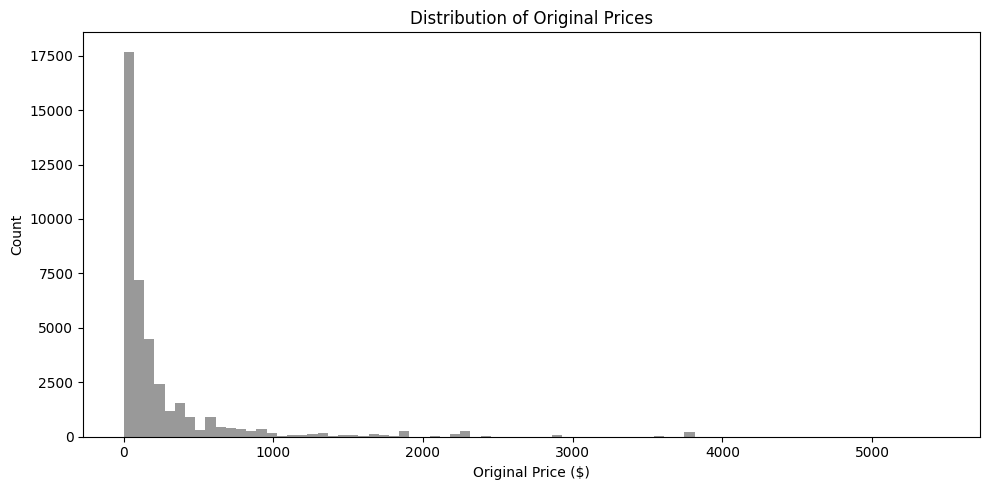

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.hist(df["original_price"], bins=80, color="gray", alpha=0.8)
plt.title("Distribution of Original Prices")
plt.xlabel("Original Price ($)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


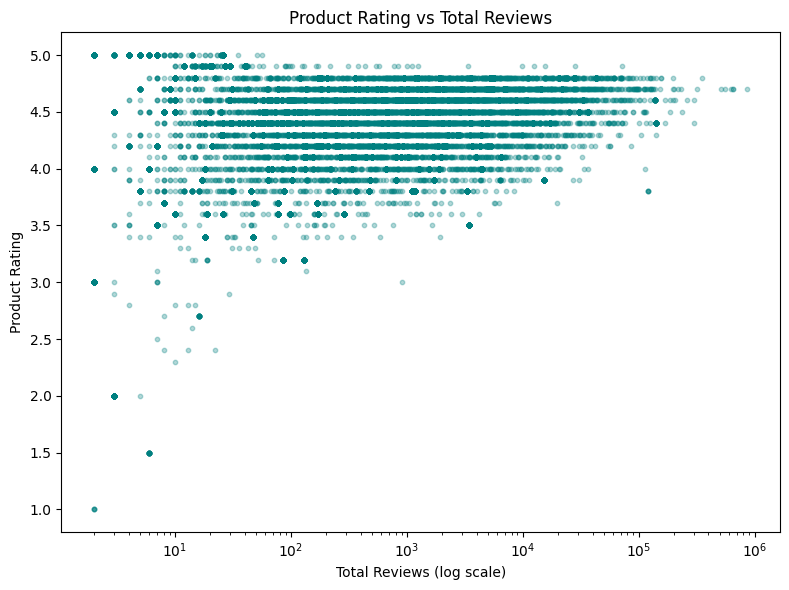

In [4]:
plt.figure(figsize=(8,6))
plt.scatter(df["total_reviews"] + 1, df["product_rating"], 
            alpha=0.3, s=10, color="teal")

plt.xscale("log")
plt.xlabel("Total Reviews (log scale)")
plt.ylabel("Product Rating")
plt.title("Product Rating vs Total Reviews")
plt.tight_layout()
plt.show()


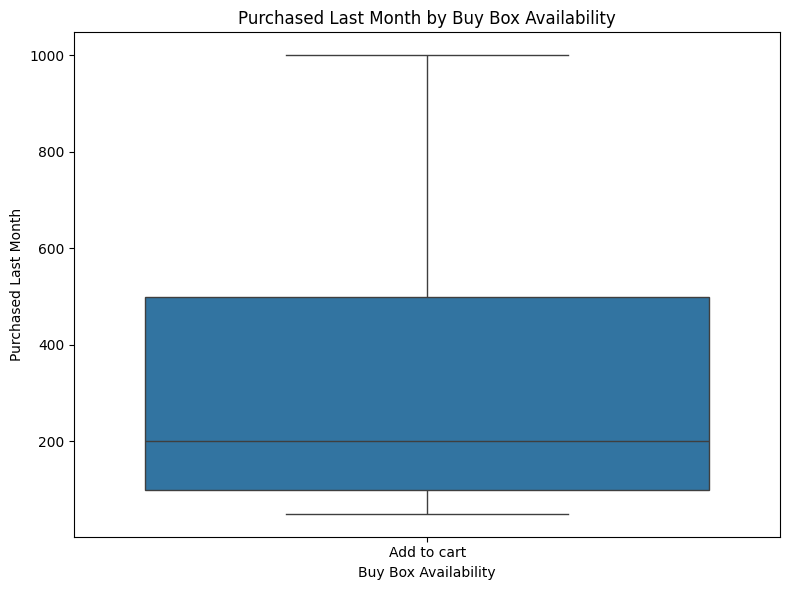

In [5]:
import seaborn as sns

plt.figure(figsize=(8,6))
sns.boxplot(
    data=df,
    x="buy_box_availability",
    y="purchased_last_month",
    showfliers=False
)

plt.title("Purchased Last Month by Buy Box Availability")
plt.xlabel("Buy Box Availability")
plt.ylabel("Purchased Last Month")
plt.tight_layout()
plt.show()


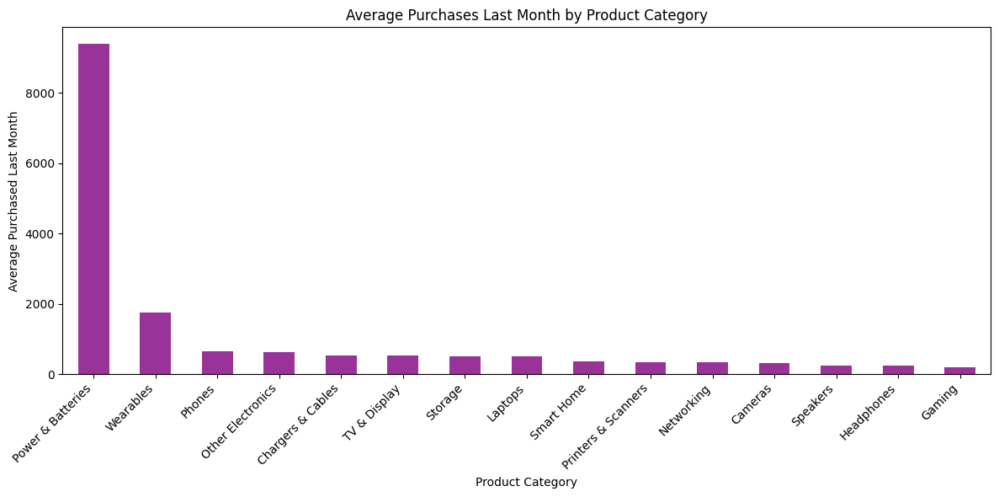

In [6]:
cat_avg = (df.groupby("product_category")["purchased_last_month"]
             .mean()
             .sort_values(ascending=False)
          )

plt.figure(figsize=(12,6))
cat_avg.plot(kind="bar", color="purple", alpha=0.8)
plt.title("Average Purchases Last Month by Product Category")
plt.ylabel("Average Purchased Last Month")
plt.xlabel("Product Category")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
